# **Classification: Decision Trees**

---



## **Two-Class Example: Insurance Smoker**

### Import Libraries and Data

In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function

df = pd.read_csv('https://www.ishelp.info/data/insurance.csv')
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


### Encoding Categorical Features/Labels

In [2]:
# Or use GetDummies() like we did for MLR

for col in df:
  if not pd.api.types.is_numeric_dtype(df[col]):
    df = df.join(pd.get_dummies(df[col], prefix=col))

df.head()

,age,sex,bmi,children,smoker,region,charges,sex_female,sex_male,smoker_no,smoker_yes,region_northeast,region_northwest,region_southeast,region_southwest
0,19,female,27.900,0,yes,southwest,16884.92400,1,0,0,1,0,0,0,1
1,18,male,33.770,1,no,southeast,1725.55230,0,1,1,0,0,0,1,0
2,28,male,33.000,3,no,southeast,4449.46200,0,1,1,0,0,0,1,0
3,33,male,22.705,0,no,northwest,21984.47061,0,1,1,0,0,1,0,0
4,32,male,28.880,0,no,northwest,3866.85520,0,1,1,0,0,1,0,0


### Feature Selection

In [3]:
# Split dataset in features and target variable

y = df['smoker'] # Label
X = df.drop(columns=['smoker', 'smoker_yes', 'smoker_no']) # Features
X = X.select_dtypes(np.number)
X.head()

,age,bmi,children,charges,sex_female,sex_male,region_northeast,region_northwest,region_southeast,region_southwest
0,19,27.900,0,16884.92400,1,0,0,0,0,1
1,18,33.770,1,1725.55230,0,1,0,0,1,0
2,28,33.000,3,4449.46200,0,1,0,0,1,0
3,33,22.705,0,21984.47061,0,1,0,1,0,0
4,32,28.880,0,3866.85520,0,1,0,1,0,0


### Splitting Data

In [4]:
# Split dataset into training set and test set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

### Build Decision Tree Model

In [5]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

# Predict the labels for test dataset
y_pred = clf.predict(X_test)

In [6]:
# View the predicted versus actual in a DataFrame

output_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred,})
output_df.head(50)

,Actual,Predicted
559,no,no
1087,no,no
1020,no,no
460,no,no
802,no,no
298,yes,yes
481,no,no
616,no,no
763,no,no
750,yes,yes


## **Evaluation Metrics**

In [8]:
# Import scikit-learn metrics module. See complete list of Classification metrics here: https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics
from sklearn import metrics

from matplotlib import pyplot as plt
cm = metrics.confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(cm, ['no', 'yes'])
cm_display.plot(values_format='d')
plt.show()

SyntaxError: positional argument follows keyword argument (Temp/ipykernel_19004/733756023.py, line 6)

In [ ]:
# Several of these metrics have to work off of dummy codes rather than categorical values. Therefore:
y_test_dummies = pd.get_dummies(y_test)
y_pred_dummies = pd.get_dummies(y_pred)

# Accuracy  = (true positives + true negatives) / (total cases); ranges from 0 (worst) to 1 (best)
print(f"Accuracy:\t{metrics.accuracy_score(y_test, y_pred)}")

# Precision = (true positives / (true positives + false positives))
print(f"Precision:\t{metrics.precision_score(y_test_dummies.yes, y_pred_dummies.yes, labels=['no', 'yes'])}")

# Recall    = (true positives / (true positives + false negatives)) 
print(f"Recall:\t\t{metrics.recall_score(y_test_dummies.yes, y_pred_dummies.yes, labels=['no', 'yes'])}")

# F1        = (2 * (precision * recall) / (precision + recall))
print(f"F1:\t\t{metrics.f1_score(y_test_dummies.yes, y_pred_dummies.yes, labels=['no', 'yes'])}")

Accuracy:	0.9502487562189055
Precision:	0.8860759493670886
Recall:		0.8641975308641975
F1:		0.8749999999999999


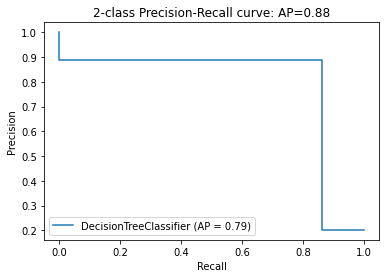

In [ ]:
# Average precision-recall score and curve
average_precision = metrics.average_precision_score(y_test_dummies, y_pred_dummies)
disp = metrics.plot_precision_recall_curve(clf, X_test, y_test)
disp.ax_.set_title('2-class Precision-Recall curve: '
                   'AP={0:0.2f}'.format(average_precision))
plt.show()

In [ ]:
# Classification Report
df_report = pd.DataFrame(metrics.classification_report(y_test_dummies.yes, y_pred_dummies.yes, output_dict=True))
df_report

,0,1,accuracy,macro avg,weighted avg
precision,0.965944,0.886076,0.950249,0.926010,0.949851
recall,0.971963,0.864198,0.950249,0.918080,0.950249
f1-score,0.968944,0.875000,0.950249,0.921972,0.950015
support,321.000000,81.000000,0.950249,402.000000,402.000000


## **Visualizing Decision Trees**

In [ ]:
!pip install graphviz
!pip install pydotplus

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


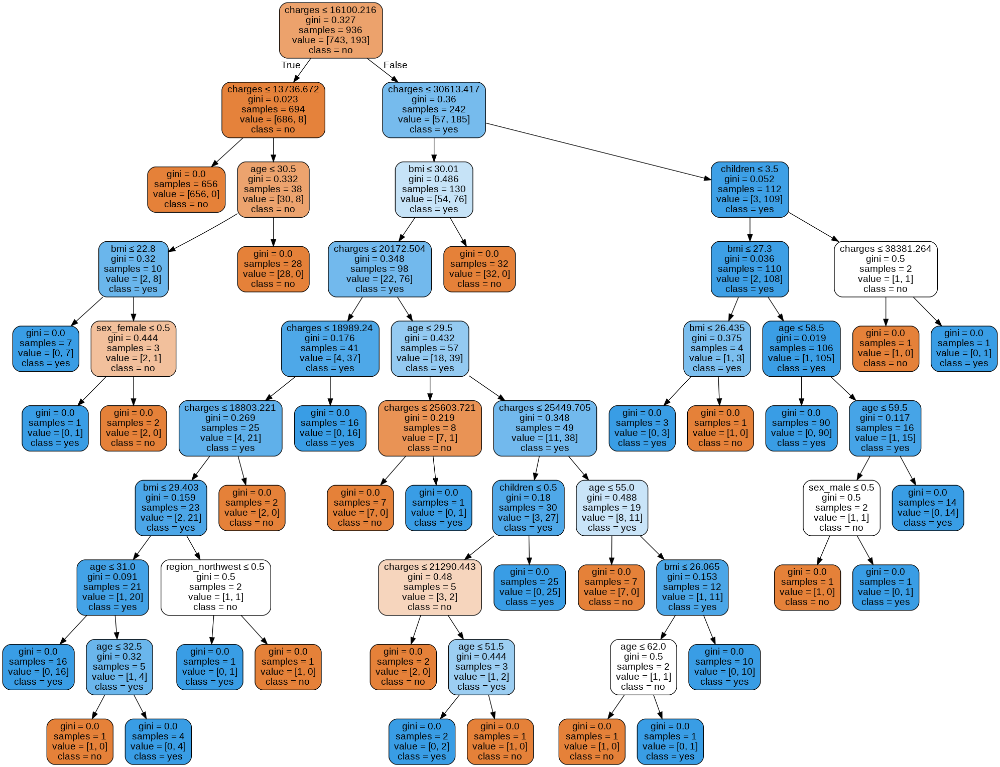

In [ ]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns,class_names=['no','yes'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('smoker.png')
Image(graph.create_png())

## **Multi-Class Decision Trees**

### Import Libraries and Data

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function

df = pd.read_csv('https://www.ishelp.info/data/lc_xs.csv')
print(df.columns)
df = df[['loan_status', 'purpose', 'home_ownership', 'annual_inc', 'verification_status', 'dti']]
df.dropna(inplace=True)
print(df.shape, '\n')
df.head()

Index(['loan_status', 'loan_status_numeric', 'loan_amnt', 'issue_d', 'term',
       'int_rate', 'installment', 'total_pymnt', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'title', 'purpose', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'acc_now_delinq', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'tot_coll_amt', 'tot_cur_bal',
       'total_acc', 'total_rev_hi_lim', 'dti', 'grade', 'sub_grade'],
      dtype='object')
(20922, 6) 



,loan_status,purpose,home_ownership,annual_inc,verification_status,dti
0,Current,debt_consolidation,MORTGAGE,74509.0,Not Verified,9.07
1,Charged Off,debt_consolidation,RENT,59000.0,Not Verified,21.99
2,Charged Off,debt_consolidation,RENT,50000.0,Verified,15.63
3,Fully Paid,debt_consolidation,MORTGAGE,98000.0,Verified,23.99
4,Current,credit_card,MORTGAGE,101000.0,Source Verified,9.07


### Encoding Categorical Features/Labels

In [ ]:
# Create dummy codes for all features and not the label

for col in df.columns:
  if col != 'loan_status':
    if not pd.api.types.is_numeric_dtype(df[col]):
      df = pd.get_dummies(df, columns=[col], prefix=col)

df.head()

,loan_status,annual_inc,dti,purpose_car,purpose_credit_card,purpose_debt_consolidation,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,home_ownership_ANY,home_ownership_MORTGAGE,home_ownership_OWN,home_ownership_RENT,verification_status_Not Verified,verification_status_Source Verified,verification_status_Verified
0,Current,74509.0,9.07,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
1,Charged Off,59000.0,21.99,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
2,Charged Off,50000.0,15.63,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
3,Fully Paid,98000.0,23.99,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
4,Current,101000.0,9.07,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0


### Feature Selection

In [ ]:
# Split dataset in features and target variable

y = df.loan_status # Label
X = df.drop(columns=['loan_status']) # Features
X = X.select_dtypes(np.number)
X.head()

,annual_inc,dti,purpose_car,purpose_credit_card,purpose_debt_consolidation,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,home_ownership_ANY,home_ownership_MORTGAGE,home_ownership_OWN,home_ownership_RENT,verification_status_Not Verified,verification_status_Source Verified,verification_status_Verified
0,74509.0,9.07,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
1,59000.0,21.99,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
2,50000.0,15.63,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
3,98000.0,23.99,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
4,101000.0,9.07,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0


### Splitting Data

In [ ]:
# Split dataset into training set and test set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test
X_train.head()

,annual_inc,dti,purpose_car,purpose_credit_card,purpose_debt_consolidation,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,home_ownership_ANY,home_ownership_MORTGAGE,home_ownership_OWN,home_ownership_RENT,verification_status_Not Verified,verification_status_Source Verified,verification_status_Verified
2204,54000.0,11.11,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
18831,75000.0,4.42,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
18314,52000.0,15.16,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
10116,70000.0,24.69,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
18802,157000.0,15.63,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0


### Build Decision Tree Model

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

# Predict the labels for test dataset
y_pred = clf.predict(X_test)

In [ ]:
# View the predicted versus actual in a DataFrame

output_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred,})
output_df.head(10)

,Actual,Predicted
15827,Current,Current
12344,Late (16-30 days),Fully Paid
14812,Fully Paid,Fully Paid
15636,Current,Current
1428,Current,Current
9692,Charged Off,Current
7632,Current,Fully Paid
20246,Current,Fully Paid
14782,Current,Current
3356,In Grace Period,Current


### Evaluation Metrics

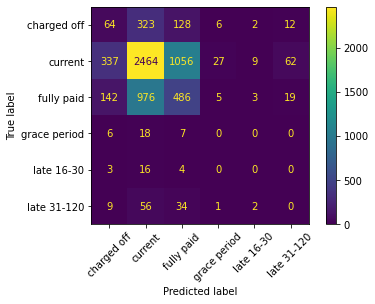

Current               3955
Fully Paid            1631
Charged Off            535
Late (31-120 days)     102
In Grace Period         31
Late (16-30 days)       23
Name: loan_status, dtype: int64


In [ ]:
# Import scikit-learn metrics module. See complete list of Classification metrics here: https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics
from sklearn import metrics
from matplotlib import pyplot as plt

cm = metrics.confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(cm, ['charged off', 'current', 'fully paid', 'grace period', 'late 16-30', 'late 31-120'])
cm_display.plot(values_format='d')
plt.xticks(rotation=45)
plt.show()

print(y_test.value_counts())

In [ ]:
# Classification Report
y_test_dummies = pd.get_dummies(y_test)
y_pred_dummies = pd.get_dummies(y_pred)

report_dict = metrics.classification_report(y_test_dummies, y_pred_dummies, target_names=['charged off', 'current', 'fully paid', 'grace period', 'late 16-30', 'late 31-120'], output_dict=True)
from sklearn.metrics import classification_report

df_report = pd.DataFrame(report_dict)
df_report

,charged off,current,fully paid,grace period,late 16-30,late 31-120,micro avg,macro avg,weighted avg,samples avg
precision,0.114082,0.639502,0.283382,0.0,0.0,0.0,0.480166,0.172828,0.486293,0.480166
recall,0.119626,0.623009,0.297977,0.0,0.0,0.0,0.480166,0.173435,0.480166,0.480166
f1-score,0.116788,0.631148,0.290496,0.0,0.0,0.0,0.480166,0.173072,0.483108,0.480166
support,535.000000,3955.000000,1631.000000,31.0,23.0,102.0,6277.000000,6277.000000,6277.000000,6277.000000


### Vizualize

In [9]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus 

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names = X.columns, class_names=['charged off', 'current', 'fully paid', 'grace period', 'late 16-30', 'late 31-120'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

ModuleNotFoundError: No module named 'sklearn.externals.six'

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,7), dpi=1000)

fn = ['annual_inc', 'dti', 'purpose_car', 'purpose_credit_card', 'purpose_debt_consolidation', 'purpose_home_improvement', 'purpose_house', 'purpose_major_purchase', 'purpose_medical', 'purpose_moving', 'purpose_other', 'purpose_renewable_energy', 'purpose_small_business', 'purpose_vacation', 'home_ownership_ANY', 'home_ownership_MORTGAGE', 'home_ownership_OWN', 'home_ownership_RENT', 'verification_status_Not Verified', 'verification_status_Source Verified', 'verification_status_Verified']
cn = ['Charged Off', 'Current', 'Fully Paid', 'In Grace Period', 'Late (16-30 days)', 'Late (31-120 days)']

tree.plot_tree(clf, feature_names=fn, class_names=cn, filled=True);

## **Decision Trees Regression**

### Import Libraries and Data

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor # Import Decision Tree Regression algorithm
from sklearn.model_selection import train_test_split # Import train_test_split function
  
df = pd.read_csv('https://www.ishelp.info/data/insurance.csv')
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


### Encoding Categorical Features/Labels

In [ ]:
# Create dummy codes for all features and not the label

for col in df.columns:
  if not pd.api.types.is_numeric_dtype(df[col]):
    df = pd.get_dummies(df, columns=[col], prefix=col)

df.head()

,age,bmi,children,charges,sex_female,sex_male,smoker_no,smoker_yes,region_northeast,region_northwest,region_southeast,region_southwest
0,19,27.900,0,16884.92400,1,0,0,1,0,0,0,1
1,18,33.770,1,1725.55230,0,1,1,0,0,0,1,0
2,28,33.000,3,4449.46200,0,1,1,0,0,0,1,0
3,33,22.705,0,21984.47061,0,1,1,0,0,1,0,0
4,32,28.880,0,3866.85520,0,1,1,0,0,1,0,0


### Feature Selection

In [ ]:
# Split dataset in features and target variable

y = df.charges # Label
X = df.drop(columns=['charges']) # Features
X = X.select_dtypes(np.number)
X.head()

,age,bmi,children,sex_female,sex_male,smoker_no,smoker_yes,region_northeast,region_northwest,region_southeast,region_southwest
0,19,27.900,0,1,0,0,1,0,0,0,1
1,18,33.770,1,0,1,1,0,0,0,1,0
2,28,33.000,3,0,1,1,0,0,0,1,0
3,33,22.705,0,0,1,1,0,0,1,0,0
4,32,28.880,0,0,1,1,0,0,1,0,0


### Splitting Data

In [ ]:
# Split dataset into training set and test set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test
X_train.head()

,age,bmi,children,sex_female,sex_male,smoker_no,smoker_yes,region_northeast,region_northwest,region_southeast,region_southwest
744,50,26.41,0,0,1,1,0,0,1,0,0
363,21,26.40,1,1,0,1,0,0,0,0,1
10,25,26.22,0,0,1,1,0,1,0,0,0
970,50,28.16,3,1,0,1,0,0,0,1,0
634,51,39.70,1,0,1,1,0,0,0,0,1


### Build Decision Tree Model

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeRegressor()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

# Predict the labels for test dataset
y_pred = clf.predict(X_test)

In [ ]:
# View the predicted versus actual in a DataFrame

output_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred,})
output_df.head(10)

,Actual,Predicted
559,1646.42970,1137.01100
1087,11353.22760,11842.62375
1020,8798.59300,8457.81800
460,10381.47870,10702.64240
802,2103.08000,1964.78000
298,38746.35510,39983.42595
481,9304.70190,9048.02730
616,11658.11505,11658.37915
763,3070.80870,3857.75925
750,19539.24300,20296.86345


### Evaluation Metrics

In [ ]:
# Import scikit-learn metrics module. See complete list of Classification metrics here: https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics
from sklearn import metrics

print(f'R squared:\t{metrics.r2_score(y_test, y_pred)}')
print(f'MAE:\t\t{metrics.mean_absolute_error(y_test, y_pred)}')
print(f'RMSE:\t\t{metrics.mean_squared_error(y_test, y_pred)**(1/2)}')

R squared:	0.721151279310889
MAE:		2956.744326365672
RMSE:		6286.295645580325


If you completed the chapter on multiple linear regression(MLR), then you may be interested to note that the MLR algorithm actually did a better job of predicting insurance charges than Decision Trees. 

As a reminder, here is what we got from the MLR for the same model:

*   R squared:	  0.750566710949346
*   MAE:	        4011.4496793279827
*   RMSE:	        5774.296305780867

This occasionally when the features are normally distributed and meet all assumptions of MLR. In this case, the insurance dataset has been highly cleaned for teaching purposes. However, that is not typically the case with "real" data. Decision Trees will usually outperform MLR if the data are highly skewed. Advanced versions of Decision Trees like Random Forests and XGBoost will do even better.